# ETH/BTC Price Forecast Model
Analysis to determine the ideal model to predict future ETH prices.

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

## Helper Functions

In [2]:
def adf_test(series):
    result = adfuller(series)
    print("ADF Statistic: %f" % result[0])
    print("p-value: %f" % result[1])

In [35]:
def print_model_parameters(model):
    try:
        print("AR Params: %s" % model.arparams)
    except AttributeError:
        print("AR Params: None")

    try:
        print("MA Params: %s" % model.maparams)
    except AttributeError:
        print("MA Params: None")

In [36]:
def print_information_criterias(models, priority):
    models.sort(key=priority, reverse=False)
    print("First model - AIC: %s, BIC: %s" % (models[0].aic, models[0].bic))
    print("Last model - AIC: %s, BIC: %s" % (models[-1].aic, models[-1].bic))

In [3]:
# ignore warning messages
import warnings
warnings.filterwarnings("ignore")

## Import Data

In [4]:
eth_btc = pd.read_csv("ETH-USD_1y200716d.csv", parse_dates=[0], index_col=0, squeeze=True)
eth_btc.head()

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2020-07-16,238.450912,239.006256,231.621170,233.640884,233.640884,5.832058e+09
2020-07-17,233.691391,234.415070,232.109970,232.773087,232.773087,5.859851e+09
2020-07-18,232.855682,236.543976,232.324890,235.483810,235.483810,5.397402e+09
2020-07-19,235.458298,239.160690,233.279739,238.487518,238.487518,6.251377e+09
2020-07-20,238.494873,239.576248,234.852646,236.153168,236.153168,5.600686e+09


In [5]:
eth_btc_close = eth_btc.drop(columns=["Open", "High", "Low", "Adj Close", "Volume"]).dropna()
eth_btc_close.head()

,Close
Date,
2020-07-16,233.640884
2020-07-17,232.773087
2020-07-18,235.483810
2020-07-19,238.487518
2020-07-20,236.153168


In [6]:
eth_btc_open = eth_btc.drop(columns=["High", "Low", "Close", "Adj Close", "Volume"]).dropna()
eth_btc_open.head()

,Open
Date,
2020-07-16,238.450912
2020-07-17,233.691391
2020-07-18,232.855682
2020-07-19,235.458298
2020-07-20,238.494873


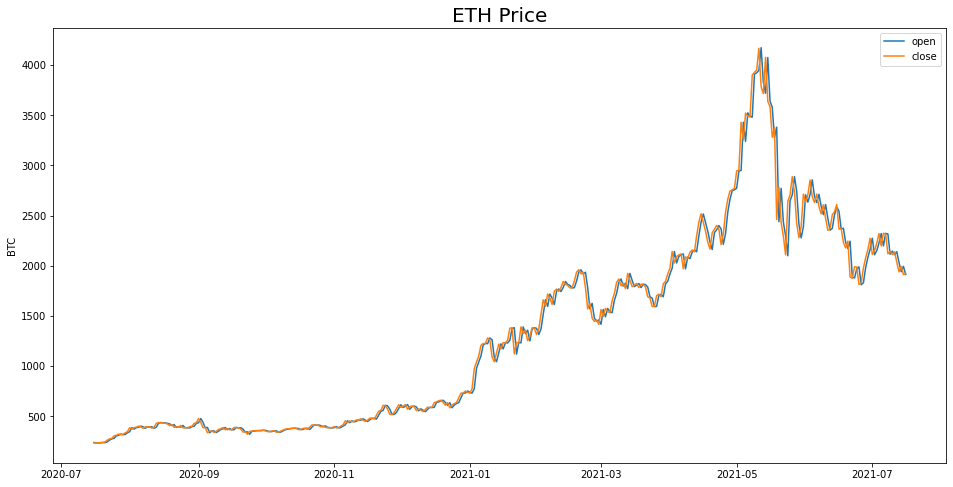

In [7]:
plt.figure(figsize=(16, 8))
plt.title("ETH Price", fontsize=20)
plt.ylabel("BTC")
plt.plot(eth_btc_open.Open, label="open")
plt.plot(eth_btc_close.Close, label="close")
plt.legend()

## Normalization

In [8]:
mean_open, std_open = eth_btc_open.Open.mean(), eth_btc_open.Open.std()
mean_close, std_close = eth_btc_close.Close.mean(), eth_btc_close.Close.std()

eth_btc_open["Open"] = (eth_btc_open.Open - mean_open) / std_open
eth_btc_close["Close"] = (eth_btc_close.Close - mean_close) / std_open

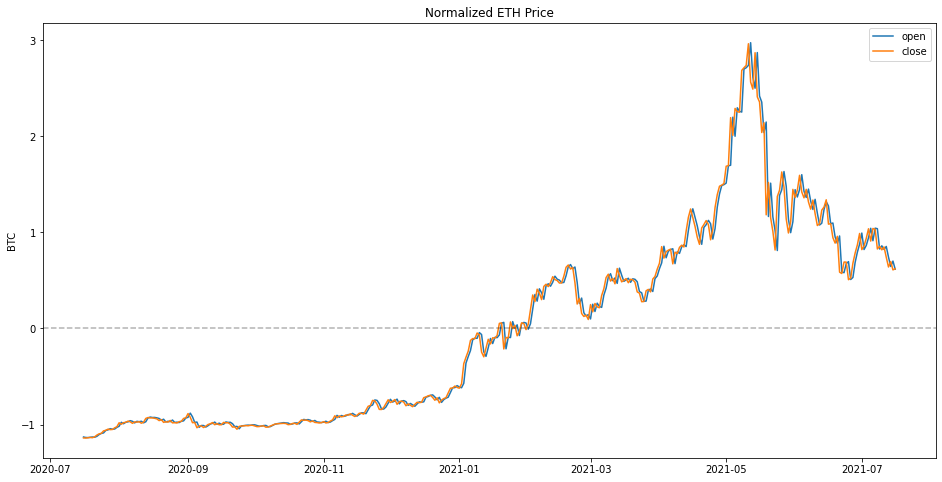

In [9]:
plt.figure(figsize=(16, 8))
plt.title("Normalized ETH Price")
plt.ylabel("BTC")
plt.plot(eth_btc_open.Open, label="open")
plt.plot(eth_btc_close.Close, label="close")
plt.legend()
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

## Stationarize

### Daily Change (P<sub>close</sub> - P<sub>open</sub>)

In [10]:
eth_btc_change = pd.DataFrame()
eth_btc_change["Change"] = eth_btc_close.Close - eth_btc_open.Open

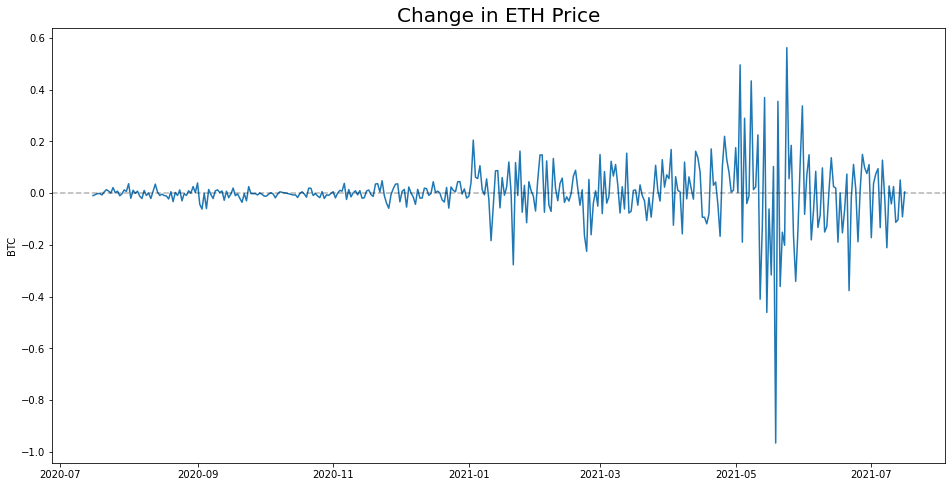

In [11]:
plt.figure(figsize=(16, 8))
plt.title("Change in ETH Price", fontsize=20)
plt.ylabel("BTC")
plt.plot(eth_btc_change.Change)
plt.axhline(y=0, linestyle='--', color='k', alpha=0.3)

### ADF-Test for Change in ETH Price

In [12]:
adf_test(eth_btc_change.Change.dropna())

ADF Statistic: -5.968655
p-value: 0.000000


### ACF for Change in ETH Price

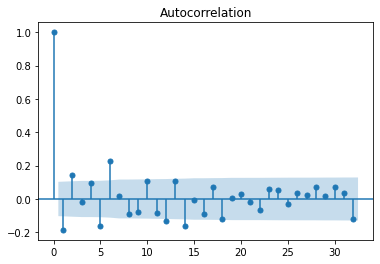

In [13]:
plot_acf(eth_btc_change.Change.dropna(), lags=32)
plt.show()

## MA(1), MA(2), MA(5), MA(6), MA(12), MA(14), MA(18)

### PACF for Change in ETH Price

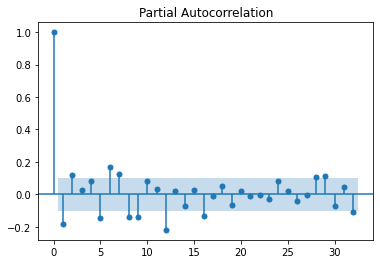

In [14]:
plot_pacf(eth_btc_change.Change.dropna(), lags=32)
plt.show()

## AR(1), AR(2), AR(5), AR(6), AR(7), AR(8), AR(9), AR(12), AR(16), AR(28), AR(29), AR(32)

In [15]:
p_params = [1, 2, 5, 6, 7, 8, 9, 12, 16, 28, 29, 32]
q_params = [1, 2, 5, 6, 12, 14, 18]
models = list()

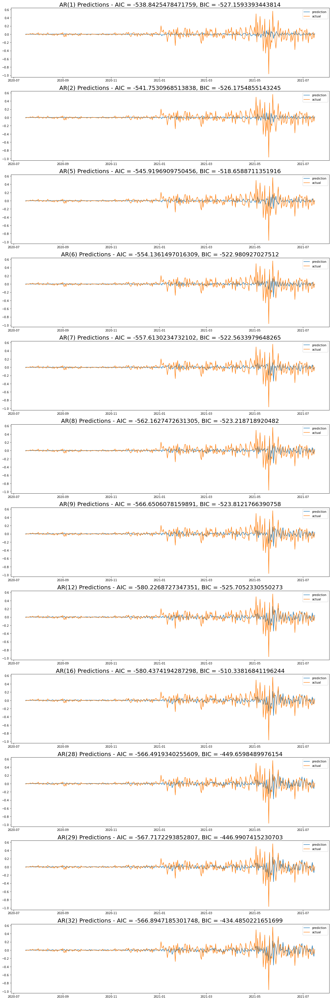

In [16]:
plt.figure(figsize=(16, len(p_params) * 4))
for i, p in enumerate(p_params):
    model = ARIMA(eth_btc_change.Change, order=(p, 0, 0))
    model_fit = model.fit()
    models.append(model_fit)
    plt.subplot(len(p_params), 1, i + 1)
    plt.title("AR(%s) Predictions - AIC = %s, BIC = %s" % (p, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(eth_btc_change.Change, label="actual")
    plt.legend()
plt.tight_layout()

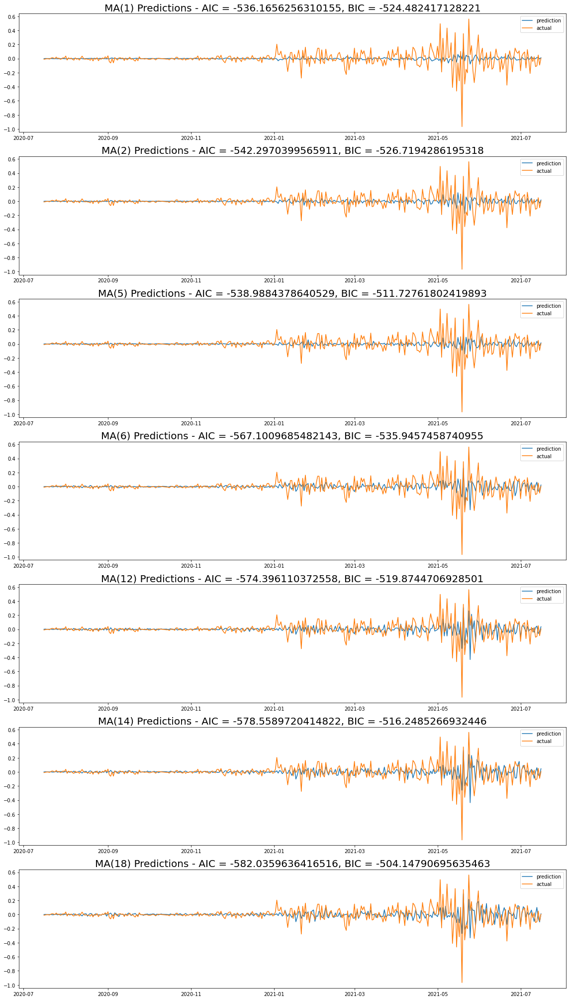

In [17]:
plt.figure(figsize=(16, len(q_params) * 4))
for i, q in enumerate(q_params):
    model = ARIMA(eth_btc_change.Change, order=(0, 0, q))
    model_fit = model.fit()
    models.append(model_fit)
    plt.subplot(len(q_params), 1, i + 1)
    plt.title("MA(%s) Predictions - AIC = %s, BIC = %s" % (q, model_fit.aic, model_fit.bic), fontsize=20)
    plt.plot(model_fit.fittedvalues, label="prediction")
    plt.plot(eth_btc_change.Change, label="actual")
    plt.legend()
plt.tight_layout()

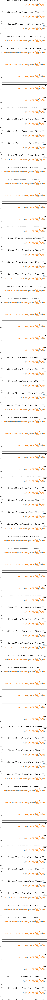

In [18]:
plt.figure(figsize=(16, len(p_params) * len(q_params) * 4))
idx = 0
for i, p in enumerate(p_params):
    for j, q in enumerate(q_params):
        idx += 1
        model = ARIMA(eth_btc_change.Change, order=(p, 0, q))
        model_fit = model.fit()
        models.append(model_fit)
        plt.subplot(len(p_params) * len(q_params), 1, idx)
        plt.title("ARMA(%s, %s) Predictions - AIC = %s, BIC = %s" % (p, q, model_fit.aic, model_fit.bic), fontsize=20)
        plt.plot(model_fit.fittedvalues, label="prediction")
        plt.plot(eth_btc_change.Change, label="actual")
        plt.legend()
plt.tight_layout()

## 7 AR Models, 12 MA Models, 84 ARMA Models

In [20]:
len(models)

103

In [37]:
print_information_criterias(models, priority=lambda m: m.aic)

First model - AIC: -587.0513516933912, BIC: -485.7968780025051
Last model - AIC: -536.1656256310155, BIC: -524.482417128221


In [38]:
print_information_criterias(models, priority=lambda m: m.bic)

First model - AIC: -577.8520490892872, BIC: -538.9080207466387
Last model - AIC: -547.1365781724546, BIC: -344.6276307906824


In [39]:
optimal_model = models[0]

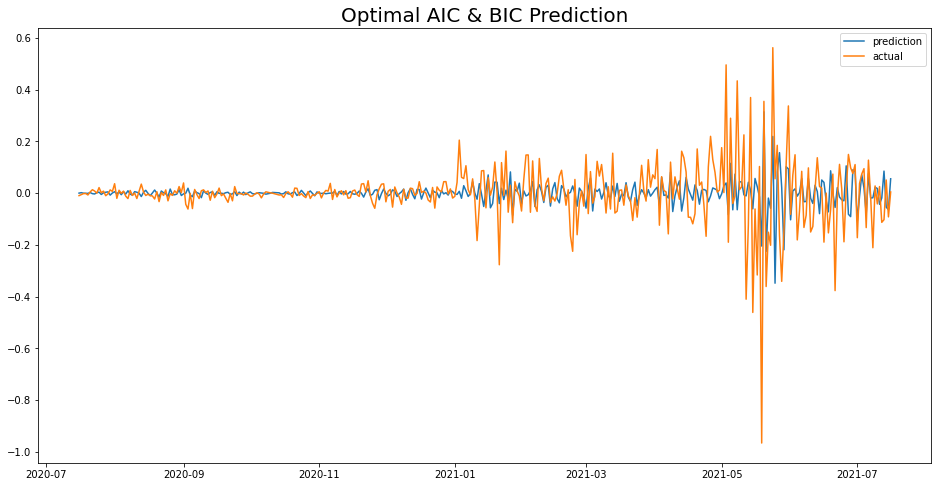

In [29]:
plt.figure(figsize=(16, 8))
plt.title("Optimal AIC & BIC Prediction", fontsize=20)
plt.plot(optimal_model.fittedvalues, label="prediction")
plt.plot(eth_btc_change.Change, label="actual")
plt.legend()

In [40]:
print_model_parameters(optimal_model)

AR Params: [-0.31731147 -0.61256237 -0.0382429   0.11873    -0.12490852  0.17177182]
MA Params: [0.193788   0.78718726]


## ARMA(6, 2) is the optimal model for this prediction
## ARIMA(6, 1, 2) is the optimal model for the raw data